In [1]:
import pandas as pd
import numpy as np
#!pip install xgboost --upgrade
#!pip install matplotlib --upgrade
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score


In [2]:
data = pd.read_excel(r"C:\Users\rups_\OneDrive - Oklahoma A and M System\PhD PETE\Summer 2021\modelling\Modelling fugacity\extended_fugacity_values_filtered - v2.xlsx")
#data = pd.read_excel(r"C:\Users\rups_\OneDrive - Oklahoma A and M System\PhD PETE\Summer 2021\modelling\Modelling fugacity\combined_fugacity_data.xlsx")
data.drop(data.filter(regex="Unname"),axis=1, inplace=True)
data.rename({'fugacity': 'Fugacity coefficient'}, axis=1, inplace=True)
data.head()

,T/C,P/bar,Fugacity coefficient
0,0,2000,0.3683
1,0,1800,0.3018
2,0,1600,0.2494
3,0,1400,0.2085
4,0,1200,0.1770


In [3]:
#data=data[(data['T/C']<=500)&(data['P/bar']<=1500)]
#data=data[data['T/C']<=600]
data.tail()

,T/C,P/bar,Fugacity coefficient
337,1200,200,1.0402
338,1200,100,1.0198
339,1200,50,1.0098
340,1200,20,1.0039
341,1200,1,1.0002


In [4]:
data.describe()

,T/C,P/bar,Fugacity coefficient
count,342.000000,342.000000,342.000000
mean,292.105263,753.944444,0.762781
std,355.730978,616.492058,0.415417
min,0.000000,1.000000,0.131000
25%,40.000000,200.000000,0.376904
50%,90.000000,650.000000,0.799050
75%,500.000000,1200.000000,1.034725
max,1200.000000,2000.000000,1.817700


Outlier detection

In [5]:
# P_unique=data['P/bar'].unique()
# P_unique

array([  5,   9,  11, ..., 195, 197, 199], dtype=int64)

In [ ]:
# pos=[]
# for i in range(len(P_unique)):
#     print(P_unique[i])
#     Q1 = np.percentile(data[data['P/bar']==P_unique[i]]['Fugacity coefficient'], 25,
#                     interpolation = 'midpoint')
                   
#     Q3 = np.percentile(data[data['P/bar']==P_unique[i]]['Fugacity coefficient'], 75,
#                     interpolation = 'midpoint')
#     IQR = Q3 - Q1
#     #print(Q3+1.5*IQR)
#     #print(Q1-1.5*IQR)
#     s= data[data['P/bar']==P_unique[i]]
#     pos.extend(s.index[(s['Fugacity coefficient']<=Q3+1.5*IQR)& (s['Fugacity coefficient']>=Q3-1.5*IQR)].tolist())
#     #pos.extend(s.index[s['Fugacity coefficient']>=Q3-1.5*IQR].tolist())


In [52]:
# data.loc[pos].describe()

,T/C,P/bar,Fugacity coefficient
count,120674.000000,120674.000000,120674.000000
mean,206.619205,906.680793,0.810406
std,143.329106,409.100445,0.368480
min,0.000000,1.000000,0.131962
25%,88.000000,611.000000,0.500257
50%,168.000000,983.000000,0.790270
75%,327.000000,1241.000000,1.156240
max,499.000000,1500.000000,1.485471


In [56]:
# data.loc[pos].to_excel(r"C:\Users\rups_\OneDrive - Oklahoma A and M System\PhD PETE\Summer 2021\Data\combined_fugacity_outlier_filtered.xlsx")

The above method detects outlier but also remove some data that are not outlier when we manually check the data. So this method can't be used. Let's manually look into tableau to find the outliers and filter it. 

In [5]:
# data=pd.read_csv(r"C:\Users\rups_\OneDrive - Oklahoma A and M System\PhD PETE\Summer 2021\modelling\Modelling fugacity\fugacity_outlier_filtered_manually.csv")
# data.head()

,T/C,P/bar,Fugacity
0,38,15,0.933776
1,38,17,0.925084
2,38,19,0.916422
3,38,21,0.907790
4,38,23,0.899186


In [6]:
# data.describe()

,T/C,P/bar,Fugacity
count,128471.000000,128471.000000,128471.000000
mean,202.221015,913.545960,0.803793
std,142.000104,407.684406,0.369805
min,0.000000,1.000000,0.131962
25%,84.000000,633.000000,0.490034
50%,170.000000,989.000000,0.799384
75%,317.000000,1245.000000,1.142532
max,499.000000,1500.000000,1.485471


In [ ]:
data.to_csv("fugacity_coefficients_data.csv")

In [3]:
X = data.iloc[:,0:2]
y = data.iloc[:,2]
#y = y.values.reshape(-1,1)
print("the shape of X is {} and the shape of the target y is {}".format(X.shape, y.shape))

the shape of X is (342, 2) and the shape of the target y is (342,)


In [4]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

In [12]:
X_train.describe()

,T/C,P/bar
count,273.000000,273.000000
mean,280.915751,786.483516
std,349.627276,610.900174
min,0.000000,1.000000
25%,40.000000,200.000000
50%,90.000000,700.000000
75%,500.000000,1200.000000
max,1200.000000,2000.000000


In [25]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [26]:
from sklearn import svm
regressor_rbf = svm.SVR(kernel='rbf')
regressor_rbf.fit(X_train_scaled,y_train.ravel())

SVR()

In [27]:
# Look at parameters used by our current forest
from pprint import pprint
print('Parameters currently in use:\n')
pprint(regressor_rbf.get_params())

Parameters currently in use:

{'C': 1.0,
 'cache_size': 200,
 'coef0': 0.0,
 'degree': 3,
 'epsilon': 0.1,
 'gamma': 'scale',
 'kernel': 'rbf',
 'max_iter': -1,
 'shrinking': True,
 'tol': 0.001,
 'verbose': False}


hyperparameter tuning for rbf svm

In [28]:
from sklearn.model_selection import GridSearchCV
 
# defining parameter range
param_grid = {'C': [1, 10, 100,1000],
              'gamma': [1, 0.1, 0.01, 0.001,'scale']}
 
grid_rbf = GridSearchCV(svm.SVR(kernel='rbf'), param_grid, refit = True, verbose = False)
 
# fitting the model for grid search
grid_rbf.fit(X_train_scaled,y_train.ravel())
print(grid_rbf.best_params_)

{'C': 100, 'gamma': 1}


In [29]:
grid_rbf=grid_rbf.best_estimator_
yhat_grid_rbf_train = grid_rbf.predict(X_train_scaled).reshape(-1,1)
yhat_grid_rbf = grid_rbf.predict(X_test_scaled).reshape(-1,1)
yhat_rbf = regressor_rbf.predict(X_test_scaled).reshape(-1,1)
yhat_rbf_train = regressor_rbf.predict(X_train_scaled).reshape(-1,1)

print("rbf SVM")
print("-"*40)
train_error_rbf= mean_squared_error(y_train,yhat_rbf_train)
print("train_error from rbf SVM is: {}".format(train_error_rbf))
validation_error_rbf= mean_squared_error(y_test,yhat_rbf)
print("validation_error from rbf SVM is: {}".format(validation_error_rbf))
print("Validation R2-score: %.4f" % r2_score(y_test , yhat_rbf))
print(" ")

print("rbf SVM after hyperparameter tuning")
print("-"*40)
train_error_grid_rbf= mean_squared_error(y_train,yhat_grid_rbf_train)
print("train_error from grid rbf SVM is: {}".format(train_error_grid_rbf))
validation_error_grid_rbf= mean_squared_error(y_test,yhat_grid_rbf)
print("validation_error from grid rbf SVM is: {}".format(validation_error_grid_rbf))
print("Validation R2-score: %.4f" % r2_score(y_test , yhat_grid_rbf))

print("best parameters")
print("-"*40)
pprint(grid_rbf.get_params())

rbf SVM
----------------------------------------
train_error from rbf SVM is: 0.005160386667644857
validation_error from rbf SVM is: 0.004199553129356356
Validation R2-score: 0.9749
 
rbf SVM after hyperparameter tuning
----------------------------------------
train_error from grid rbf SVM is: 0.0035826272579405397
validation_error from grid rbf SVM is: 0.004214203088153262
Validation R2-score: 0.9748
best parameters
----------------------------------------
{'C': 100,
 'cache_size': 200,
 'coef0': 0.0,
 'degree': 3,
 'epsilon': 0.1,
 'gamma': 1,
 'kernel': 'rbf',
 'max_iter': -1,
 'shrinking': True,
 'tol': 0.001,
 'verbose': False}


In [30]:
from sklearn.ensemble import RandomForestRegressor
regressor_rf = RandomForestRegressor(random_state=1)
regressor_rf.fit(X_train_scaled, y_train.ravel())

RandomForestRegressor(random_state=1)

Random Forest Hyperparameter Tuning

In [31]:
print('Parameters currently in use:\n')
pprint(regressor_rf.get_params())

Parameters currently in use:

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': None,
 'max_features': 1.0,
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 1,
 'verbose': 0,
 'warm_start': False}


In [32]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

In [33]:
from sklearn.model_selection import RandomizedSearchCV
random_rf = RandomizedSearchCV(estimator = RandomForestRegressor(), param_distributions = random_grid, n_iter = 100, cv = 3, verbose=False, random_state=1, n_jobs = -1)
random_rf.fit(X_train_scaled,y_train.ravel())
random_rf.best_params_

c:\Users\rups_\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


{'n_estimators': 800,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'auto',
 'max_depth': 110,
 'bootstrap': True}

In [34]:
random_rf=random_rf.best_estimator_
yhat_random_rf_train = random_rf.predict(X_train_scaled).reshape(-1,1)
yhat_random_rf = random_rf.predict(X_test_scaled).reshape(-1,1)
yhat_rf = regressor_rf.predict(X_test_scaled).reshape(-1,1)
yhat_rf_train = regressor_rf.predict(X_train_scaled).reshape(-1,1)

print("rf")
print("-"*40)
train_error_rf= mean_squared_error(y_train,yhat_rf_train)
print("train_error from rf is: {}".format(train_error_rf))
validation_error_rf= mean_squared_error(y_test,yhat_rf)
print("validation_error from rf is: {}".format(validation_error_rf))
print("Validation R2-score: %.4f" % r2_score(y_test , yhat_rf))
print(" ")

print("rf SVM after hyperparameter tuning with Random Search")
print("-"*40)
train_error_random_rf= mean_squared_error(y_train,yhat_random_rf_train)
print("train_error from random rf is: {}".format(train_error_random_rf))
validation_error_random_rf= mean_squared_error(y_test,yhat_random_rf)
print("validation_error from random rf is: {}".format(validation_error_random_rf))
print("Validation R2-score: %.4f" % r2_score(y_test , yhat_random_rf))

rf
----------------------------------------
train_error from rf is: 0.00016371908930340833
validation_error from rf is: 0.0008959040696226581
Validation R2-score: 0.9946
 
rf SVM after hyperparameter tuning with Random Search
----------------------------------------
train_error from random rf is: 0.00015480856989183138
validation_error from random rf is: 0.0008380384137600147
Validation R2-score: 0.9950


In [35]:
from sklearn.tree import DecisionTreeRegressor
regressor_dt = DecisionTreeRegressor(random_state= 1)
regressor_dt.fit(X_train_scaled, y_train)

DecisionTreeRegressor(random_state=1)

Hyperarameter tuning for DT

In [36]:
regressor_dt.get_params()

{'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'random_state': 1,
 'splitter': 'best'}

In [37]:
parameters = {"criterion": ["mse", "mae"],
            "splitter":["best","random"],
              "min_samples_split": [2,3,4,5,6,7,8,9,10],
              "max_depth": [8, 10, 12, 14, 16, 18, 20, None],
              "min_samples_leaf": [1,2,3,4,5,6,7,8,9,10],
              "max_leaf_nodes": [5, 20, 100,None],
              }
grid_dt=GridSearchCV(DecisionTreeRegressor(random_state= 1),param_grid=parameters,cv=3,verbose=False)
grid_dt.fit(X_train_scaled,y_train.ravel())
grid_dt.best_params_

c:\Users\rups_\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\tree\_classes.py:397: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
c:\Users\rups_\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\tree\_classes.py:397: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
c:\Users\rups_\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\tree\_classes.py:397: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
c:\Users\rups_\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\tree\_classes.py:397: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='sq

{'criterion': 'mae',
 'max_depth': 14,
 'max_leaf_nodes': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'splitter': 'random'}

In [38]:
grid_dt=grid_dt.best_estimator_
yhat_grid_dt_train = grid_dt.predict(X_train_scaled).reshape(-1,1)
yhat_grid_dt = grid_dt.predict(X_test_scaled).reshape(-1,1)
yhat_dt = regressor_dt.predict(X_test_scaled).reshape(-1,1)
yhat_dt_train = regressor_dt.predict(X_train_scaled).reshape(-1,1)

print("dt")
print("-"*40)
train_error_dt= mean_squared_error(y_train,yhat_dt_train)
print("train_error from dt is: {}".format(train_error_dt))
validation_error_dt= mean_squared_error(y_test,yhat_dt)
print("validation_error from dt is: {}".format(validation_error_dt))
print("Validation R2-score: %.4f" % r2_score(y_test , yhat_dt))
print(" ")

print("dt after hyperparameter tuning with grid Search")
print("-"*40)
train_error_grid_dt= mean_squared_error(y_train,yhat_grid_dt_train)
print("train_error from grid dt is: {}".format(train_error_grid_dt))
validation_error_grid_dt= mean_squared_error(y_test,yhat_grid_dt)
print("validation_error from grid dt is: {}".format(validation_error_grid_dt))
print("Validation R2-score: %.4f" % r2_score(y_test , yhat_grid_dt))

dt
----------------------------------------
train_error from dt is: 0.0
validation_error from dt is: 0.001169722884909525
Validation R2-score: 0.9930
 
dt after hyperparameter tuning with grid Search
----------------------------------------
train_error from grid dt is: 9.076376605360652e-06
validation_error from grid dt is: 0.0012864824254924694
Validation R2-score: 0.9923


XGBoost

In [39]:
import xgboost as xgb
from sklearn.metrics import mean_absolute_error
XGBModel = xgb.XGBRegressor(random_state=1)
XGBModel.fit(X_train.values, y_train.ravel(), verbose=False)

# Get the mean absolute error on the validation data :
#XGBpredictions = sc_y.inverse_transform(XGBModel.predict(sc_X.transform(X_test)).reshape(-1,1))
#yhat_xgb_train = sc_y.inverse_transform(XGBModel.predict(X_train).reshape(-1,1))
yhat_xgb_train = XGBModel.predict(X_train)
training_error= mean_absolute_error(y_train,yhat_xgb_train)
print("\nXGBoost training MAE: {}".format(training_error))


XGBoost training MAE: 0.002712777638252274


Hyperparameter Tuning for XGBoost

In [40]:
XGBModel.get_params()

{'objective': 'reg:squarederror',
 'base_score': 0.5,
 'booster': 'gbtree',
 'callbacks': None,
 'colsample_bylevel': 1,
 'colsample_bynode': 1,
 'colsample_bytree': 1,
 'early_stopping_rounds': None,
 'enable_categorical': False,
 'eval_metric': None,
 'feature_types': None,
 'gamma': 0,
 'gpu_id': -1,
 'grow_policy': 'depthwise',
 'importance_type': None,
 'interaction_constraints': '',
 'learning_rate': 0.300000012,
 'max_bin': 256,
 'max_cat_threshold': 64,
 'max_cat_to_onehot': 4,
 'max_delta_step': 0,
 'max_depth': 6,
 'max_leaves': 0,
 'min_child_weight': 1,
 'missing': nan,
 'monotone_constraints': '()',
 'n_estimators': 100,
 'n_jobs': 0,
 'num_parallel_tree': 1,
 'predictor': 'auto',
 'random_state': 1,
 'reg_alpha': 0,
 'reg_lambda': 1,
 'sampling_method': 'uniform',
 'scale_pos_weight': 1,
 'subsample': 1,
 'tree_method': 'exact',
 'validate_parameters': 1,
 'verbosity': None}

In [ ]:
# params = { 'max_depth': [3,6,10],
#            'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.3],
#            'n_estimators': [100, 500, 1000],
#            'colsample_bytree': [0.3, 0.7, 1],
#            'gamma': [0,1,2],
#            'reg_alpha': [0,1,2],
#            'reg_lambda': [1,2,3],
#            'subsample': [0.1, 0.5, 1],
#            'tree_method':['exact','approx','hist','auto'] 
#            }
# grid_XGBModel = GridSearchCV(estimator=xgb.XGBRegressor(random_state=1), 
#         param_grid=params,
#         scoring='neg_mean_squared_error', 
#         verbose=False)
# grid_XGBModel.fit(X_train_scaled,y_train.ravel())
# grid_XGBModel.best_params_

In [41]:
yhat_rbf = grid_rbf.predict(X_test_scaled).reshape(-1,1)
yhat_rf = random_rf.predict(X_test_scaled).reshape(-1,1)
yhat_dt = grid_dt.predict(X_test_scaled).reshape(-1,1)
yhat_xgb= XGBModel.predict(X_test)
yhat_xgb_train = XGBModel.predict(X_train)
yhat_rbf_train = grid_rbf.predict(X_train_scaled).reshape(-1,1)
yhat_rf_train = random_rf.predict(X_train_scaled).reshape(-1,1)
yhat_dt_train = grid_dt.predict(X_train_scaled).reshape(-1,1)

In [42]:
yhat_xgb= XGBModel.predict(X_test)
yhat_xgb_train = XGBModel.predict(X_train)
print("XGBoost")
print("-"*40)
train_error_xgb= mean_squared_error(y_train,yhat_xgb_train)
print("train_error from xgb is: {}".format(train_error_xgb))
validation_error_xgb= mean_squared_error(y_test,yhat_xgb)
print("validation_error from xgb is: {}".format(validation_error_xgb))
print("Validation R2-score: %.4f" % r2_score(y_test , yhat_xgb) )

XGBoost
----------------------------------------
train_error from xgb is: 2.0282276055324758e-05
validation_error from xgb is: 0.00023873340745970373
Validation R2-score: 0.9986


In [43]:
# importing module
from sklearn.linear_model import LinearRegression
# creating an object of LinearRegression class
LR = LinearRegression()
# fitting the training data
LR.fit(X_train_scaled, y_train.ravel())
yhat_lr_train = LR.predict(X_train_scaled).reshape(-1,1)
yhat_lr = LR.predict(X_test_scaled).reshape(-1,1)

In [44]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
print("Linear Regression")
print("-"*40)
train_error_lr= mean_squared_error(y_train,yhat_lr_train)
print("train_error from rbf SVM is: {}".format(train_error_lr))
validation_error_lr= mean_squared_error(y_test,yhat_lr)
print("validation_error from LR is: {}".format(validation_error_lr))
print("Validation R2-score: %.4f" % r2_score(y_test , yhat_lr))
print(" ")

print("rbf SVM")
print("-"*40)
train_error_rbf= mean_squared_error(y_train,yhat_rbf_train)
print("train_error from rbf SVM is: {}".format(train_error_rbf))
validation_error_rbf= mean_squared_error(y_test,yhat_rbf)
print("validation_error from rbf SVM is: {}".format(validation_error_rbf))
print("Validation R2-score: %.4f" % r2_score(y_test , yhat_rbf))
print(" ")

print("Random Forest")
print("-"*40)
train_error_rf= mean_squared_error(y_train,yhat_rf_train)
print("train_error from rf is: {}".format(train_error_rf))
validation_error_rf= mean_squared_error(y_test,yhat_rf)
print("validation_error from rf is: {}".format(validation_error_rf))
print("Validation R2-score: %.4f" % r2_score(y_test , yhat_rf) )
print(" ")

print("Decision Tree")
print("-"*40)
train_error_dt= mean_squared_error(y_train,yhat_dt_train)
print("train_error from dt is: {}".format(train_error_dt))
validation_error_dt= mean_squared_error(y_test,yhat_dt)
print("validation_error from dt is: {}".format(validation_error_dt))
print("Validation R2-score: %.4f" % r2_score(y_test , yhat_dt) )

print("XGBoost")
print("-"*40)
train_error_xgb= mean_squared_error(y_train,yhat_xgb_train)
print("train_error from xgb is: {}".format(train_error_xgb))
validation_error_xgb= mean_squared_error(y_test,yhat_xgb)
print("validation_error from xgb is: {}".format(validation_error_xgb))
print("Validation R2-score: %.4f" % r2_score(y_test , yhat_xgb) )

Linear Regression
----------------------------------------
train_error from rbf SVM is: 0.07889911317758687
validation_error from LR is: 0.09546633179883621
Validation R2-score: 0.4297
 
rbf SVM
----------------------------------------
train_error from rbf SVM is: 0.0035826272579405397
validation_error from rbf SVM is: 0.004214203088153262
Validation R2-score: 0.9748
 
Random Forest
----------------------------------------
train_error from rf is: 0.00015480856989183138
validation_error from rf is: 0.0008380384137600147
Validation R2-score: 0.9950
 
Decision Tree
----------------------------------------
train_error from dt is: 9.076376605360652e-06
validation_error from dt is: 0.0012864824254924694
Validation R2-score: 0.9923
XGBoost
----------------------------------------
train_error from xgb is: 2.0282276055324758e-05
validation_error from xgb is: 0.00023873340745970373
Validation R2-score: 0.9986


Model selection

Performance in validation data

In [45]:
#preds_val = pd.concat([pd.DataFrame(X_test).reset_index(drop=True), pd.DataFrame(y_test.values,columns=['actual_value']), pd.DataFrame(yhat_rbf,columns=['predicted_rbf']), pd.DataFrame(yhat_rf,columns=['predicted_rf']), pd.DataFrame(yhat_dt,columns=['predicted_dt']), pd.DataFrame(yhat_xgb, columns=['predicted_xgb'])], axis =1)
preds_val = pd.concat([pd.DataFrame(X_test).reset_index(drop=True), pd.DataFrame(y_test.values,columns=['actual_value']), pd.DataFrame(yhat_xgb, columns=['predicted_xgb'])], axis =1)
#preds.to_csv('preds.csv')
preds_val


,T/C,P/bar,actual_value,predicted_xgb
0,50,300,0.330031,0.319568
1,60,1,0.996465,0.989963
2,0,400,0.138300,0.138999
3,400,100,0.998000,1.006537
4,400,1200,1.272900,1.279040
...,...,...,...,...
64,30,1200,0.276469,0.286714
65,70,900,0.372500,0.373546
66,50,2000,0.657199,0.631421
67,1000,50,1.010200,1.005689


In [34]:
preds_val.to_excel("predction_in_validation_data.xlsx")

In [46]:
test_error_xgb= mean_squared_error(y_test,yhat_dt)

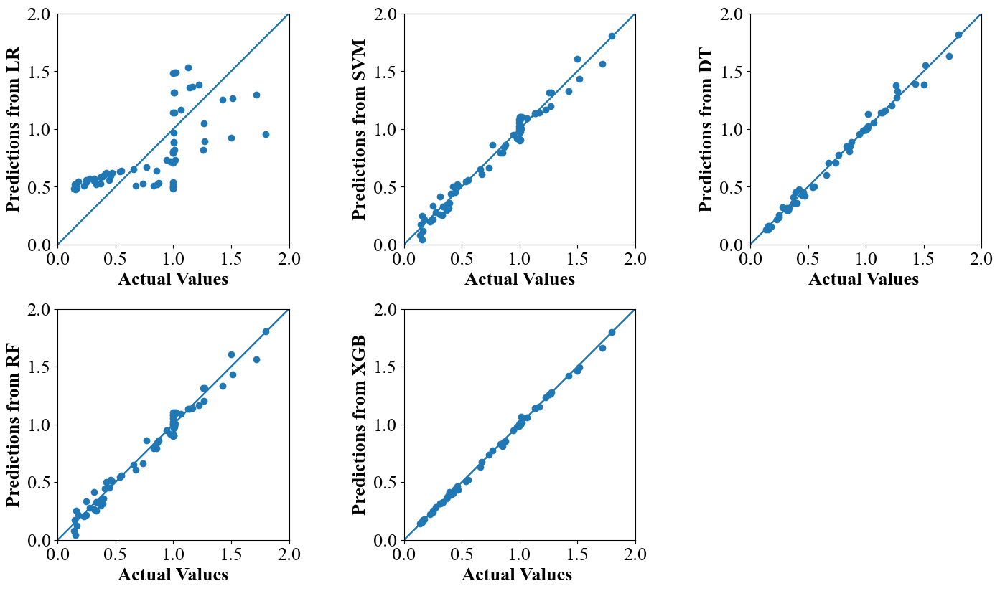

In [36]:
import matplotlib
matplotlib.rcParams.update({'font.size': 19})
plt.rcParams["font.family"] = "Times New Roman"
plt.figure(figsize=(15, 8))
plt.subplot(2, 3, 1)
plt.scatter(y_test, yhat_lr)
plt.xlabel('Actual Values',fontweight='bold')
plt.ylabel('Predictions from LR',fontweight='bold')
plt.axis('scaled')
plt.plot(range(6))
plt.xlim(0, 2)
plt.ylim(0, 2)
plt.axline((0,0), slope=1)
plt.gca().set_aspect('equal', adjustable='box')

plt.subplot(2, 3, 2)
plt.scatter(y_test, yhat_rbf)
plt.xlabel('Actual Values',fontweight='bold')
plt.ylabel('Predictions from SVM',fontweight='bold')
plt.axis('scaled')
plt.plot(range(6))
plt.xlim(0, 2)
plt.ylim(0, 2)
plt.axline((0,0), slope=1)
plt.gca().set_aspect('equal', adjustable='box')

plt.subplot(2, 3, 3)
plt.scatter(y_test, yhat_dt)
plt.xlabel('Actual Values ',fontweight='bold')
plt.ylabel('Predictions from DT',fontweight='bold')
plt.axis('scaled')
plt.plot(range(6))
plt.xlim(0, 2)
plt.ylim(0, 2)
plt.axline((0,0), slope=1)
plt.gca().set_aspect('equal', adjustable='box')
plt.tight_layout()

plt.subplot(2, 3, 4)
plt.scatter(y_test, yhat_rbf)
plt.xlabel('Actual Values',fontweight='bold')
plt.ylabel('Predictions from RF',fontweight='bold')
plt.axis('scaled')
plt.plot(range(6))
plt.xlim(0, 2)
plt.ylim(0, 2)
plt.axline((0,0), slope=1)
plt.gca().set_aspect('equal', adjustable='box')

plt.subplot(2, 3, 5)
plt.scatter(y_test, yhat_xgb)
plt.xlabel('Actual Values ',fontweight='bold')
plt.ylabel('Predictions from XGB',fontweight='bold')
plt.axis('scaled')
plt.plot(range(6))
plt.xlim(0, 2)
plt.ylim(0, 2)
plt.axline((0,0), slope=1)
plt.gca().set_aspect('equal', adjustable='box')

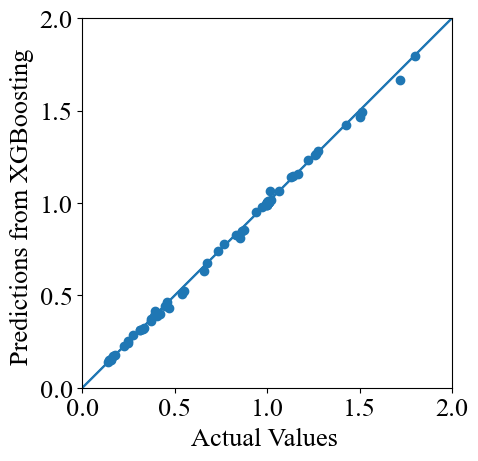

In [37]:
#plt.subplot(2, 2, 4)
plt.scatter(y_test, yhat_xgb)
plt.xlabel('Actual Values ')
plt.ylabel('Predictions from XGBoosting ')
plt.axis('scaled')
plt.plot(range(6))
plt.xlim(0, 2)
plt.ylim(0, 2)
plt.axline((0,0), slope=1)
plt.gca().set_aspect('equal', adjustable='box')

In [47]:
#Fugacity_pred = XGBModel.predict(X)
#Fugacity_pred = sc_y.inverse_transform(XGBModel.predict(sc_X.transform(X)).reshape(-1,1))
Fugacity_pred = XGBModel.predict(X)
preds = pd.concat([pd.DataFrame(X,columns=['T/C','P/bar']).reset_index(drop=True),pd.DataFrame(y.values,columns=['Fugacity_Duan']).reset_index(drop=True), pd.DataFrame(Fugacity_pred,columns=['Predicted_Fugacity'])], axis =1)


In [37]:
preds.to_excel("/content/drive/MyDrive/Modelling fugacity/pred_fugacity_XGBoost.xlsx")

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/Modelling fugacity/pred_fugacity_XGBoost.xlsx'

In [48]:
preds[preds['T/C']==0]

,T/C,P/bar,Fugacity_Duan,Predicted_Fugacity
0,0,2000,0.3683,0.368784
1,0,1800,0.3018,0.301644
2,0,1600,0.2494,0.249295
3,0,1400,0.2085,0.209645
4,0,1200,0.1770,0.178647
5,0,1000,0.1537,0.154591
6,0,900,0.1449,0.150122
7,0,800,0.1380,0.137524
8,0,700,0.1332,0.132753
9,0,600,0.1310,0.131022


In [39]:
preds.tail()

,T/C,P/bar,Fugacity_Duan,Predicted_Fugacity
337,1200,200,1.0402,1.040003
338,1200,100,1.0198,1.018465
339,1200,50,1.0098,1.004526
340,1200,20,1.0039,1.004189
341,1200,1,1.0002,0.998750


CO2 solubility estimation

In [47]:
import pickle
pickle.dump(XGBModel, open(r'C:\Users\rups_\OneDrive - Oklahoma A and M System\PhD PETE\Summer 2021\modelling\Modelling fugacity\XGBModel_phi_rf.sav','wb'))
XGBModel = pickle.load(open(r'C:\Users\rups_\OneDrive - Oklahoma A and M System\PhD PETE\Summer 2021\modelling\Modelling fugacity\XGBModel_phi_rf.sav','rb'))

In [48]:
XGBModel.predict([[600,400]])[0]

#sc_y.inverse_transform(XGBModel.predict(sc_X.transform([[600,400]])).reshape(-1,1))[0][0]

1.0790088

In [49]:
#import pickle
import math
def ln_phi_xgb(T,P): #T in C, P in bar
  filename = 'XGB_model_phi_rf.sav'
  phi_from_pickle = pickle.load(open(r'C:\Users\rups_\OneDrive - Oklahoma A and M System\PhD PETE\Summer 2021\modelling\Modelling fugacity\XGBModel_phi_rf.sav', 'rb'))
  return math.log(phi_from_pickle.predict([[T,P]])[0])

In [62]:
ln_phi_xgb(108,55)

-0.12597861656326614

In [58]:
ln_phi(108,55)

-0.12132021612817276

In [57]:
math.exp(ln_phi(700-273.15,1000))

1.2042706523754658

In [52]:
def pw_pressure(T): #T in C
    T=T+273.15
    Tc=647.29 #in K of water
    Pc=220.85 #in bar of water
    c=[0,-38.64,5.9,59.88,26.66,10.64]
    t=(T-Tc)/Tc
    first_part= Pc*T/Tc
    second_part=1+c[1]*(-t)**1.9+c[2]*t+c[3]*t**2+c[4]*t**3+c[5]*t**4
    return first_part*second_part

Old model for soluility with fugacity calculated using duan_sun thermodynamical model: requires iteration

In [53]:
import os
import pandas as pd
import math
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sn

def left_side(T,P,Vr):
    Tc=304.13 #k
    Pc=73.8 #bar
    Pr=P/Pc
    Tr=(T+273.15)/Tc
    y=(Pr*Vr/Tr)
    return y
def right_side(T,P,Vr):
    Tc=304.13 #k
    Pc=73.8 #bar
    Pr=P/Pc
    Tr=(T+273.15)/Tc
    a=[0,8.99288497*10**(-2), -4.94783127*10**(-1),4.77922245*10**(-2), 1.03808883*10**(-2), -2.82516861*10**(-2),9.49887563*10**(-2), 5.20600880*10**(-4),-2.93540971*10**(-4),-1.77265112*10**(-3), -2.51101973*10**(-5),8.93353441*10**(-5),7.88998563*10**(-5)]
    alpha=-1.66727022*10**(-2)
    Beta=1.3980
    gamma=2.96*10**(-2)
    B=a[1]+(a[2]/Tr**2)+a[3]/Tr**3
    C=a[4]+(a[5]/Tr**2)+(a[6]/Tr**3)
    D=a[7]+(a[8]/Tr**2)+(a[9]/Tr**3)
    E=a[10]+(a[11]/Tr**2)+(a[12]/Tr**3)
    F=alpha/Tr**3
    G=(F/(2*gamma))*(Beta+1-(Beta+1+gamma/Vr**2)*math.exp(-gamma/Vr**2))
    y=1+B/Vr+C/(Vr**2)+D/(Vr**4)+E/(Vr**5)+(F/Vr**2)*(Beta+gamma/Vr**2)*math.exp(-gamma/Vr**2)
    #y=1+ ((a[1]+(a[2]/Tr**2)+(a[3]/Tr**3))/Vr)+ ((a[4]+(a[5]/Tr**2)+(a[6]/Tr**3))/Vr**2)+ ((a[7]+(a[8]/Tr**2)+(a[9]/Tr**3))/Vr**4)+ ((a[10]+(a[11]/Tr**2)+(a[12]/Tr**3))/Vr**5)+ (a[13]/((Tr**3)*(Vr**2)))*(a[14]+(a[15]/Vr**2))*math.exp(-a[15]/Vr**2)
    return y

# function to calculate reduced volume Vr
#from shapely.geometry import LineString
#%matplotlib inline
def reduced_vol_new(T,P): #P in bar, T in C
    #x=np.arange(1,1000.01,0.01)
    #x=np.arange(0.1,1000.01,0.01) #valid from 48bar
    x=np.arange(0.1,1000,0.01) #valid upto P 100bar and fugacity <1.00
    right_value=[]
    left_value=[]
    x_val = []
    for i in x:
        right_value.append(right_side(T,P,i))
        left_value.append(left_side(T,P,i))
        x_val.append(i)

    s1=pd.DataFrame(list(zip(x_val, right_value)),columns=['Vr','right_side'])
    s2=pd.DataFrame(list(zip(x_val, left_value)),columns=['Vr','left_side'])
    result = pd.concat([s1, s2], axis=1)
    result['difference']=abs(result['right_side']-result ['left_side'])
    min_diff= result['difference'].min()
    id=result[['difference']].idxmin()
    final_Vr= result[['Vr']].iloc[id,1].to_string(index=False)
    return min_diff, float(final_Vr)

def ln_phi(T,P): #Phi_CO2
    Tc=304.13 #k
    Pc=73.8 #bar
    Pr=P/Pc
    Tr=(T+273.15)/Tc
    Vr=reduced_vol_new(T,P)[1]
    Z= (Pr*Vr)/Tr
    a=[0,8.99288497*10**(-2), -4.94783127*10**(-1),4.77922245*10**(-2), 1.03808883*10**(-2), -2.82516861*10**(-2),9.49887563*10**(-2), 5.20600880*10**(-4),-2.93540971*10**(-4),-1.77265112*10**(-3), -2.51101973*10**(-5),8.93353441*10**(-5),7.88998563*10**(-5)]
    alpha=-1.67*10**(-2)
    Beta=1.4
    gamma=2.96*10**-2
    B=a[1]+(a[2]/Tr**2)+a[3]/Tr**3
    C=a[4]+(a[5]/Tr**2)+(a[6]/Tr**3)
    D=a[7]+(a[8]/Tr**2)+(a[9]/Tr**3)
    E=a[10]+(a[11]/Tr**2)+(a[12]/Tr**3)
    F=alpha/Tr**3
    G=(F/(2*gamma))*(Beta+1-((Beta+1+gamma/Vr**2)*math.exp(-gamma/Vr**2)))
    #constants=((a[1]+(a[2]/Tr**2)+(a[3]/Tr**3))/Vr)+ ((a[4]+(a[5]/Tr**2)+(a[6]/Tr**3))/(2*Vr**2))+ ((a[7]+(a[8]/Tr**2)+(a[9]/Tr**3))/(4*Vr**4))+ ((a[10]+(a[11]/Tr**2)+(a[12]/Tr**3))/(5*Vr**5))+(a[13]/(2*Tr**3*a[15]))*(a[14]+1-(a[14]+1+(a[15]/Vr**2))*math.exp(-a[15]/Vr**2))
    return (Z-1-math.log(Z)+B/Vr+C/(2*Vr**2)+D/(4*Vr**4)+E/(5*Vr**5)+G)  

def CO2_mol_sw_old(T, P, m, mNa, mK, mCa, mMg, mCl, mSO4): 
    Mco2=44.01
    Mnacl=58.44
    #m=1 #1 molal NaCl brine
    Tc=304.13 #K
    Pc= 73.8 #bar
    Tr=(T+273.15)/Tc
    Pr=P/Pc
    nu=2 #for NaCl
    Vr= reduced_vol_new(T,P)[1]
    ln_phi_CO2= ln_phi(T,P)
    P_H2O=pw_pressure(T)
    c=[0,28.9447706,-0.035458,-4770.67,1.027*10**(-5),33.81,9.04*10**(-3),-1.14*10**(-3),-0.307,-0.090,9.327*10**(-4),0]
    a=[0,8.99288497*10**(-2), -4.94783127*10**(-1),4.77922245*10**(-2), 1.03808883*10**(-2), -2.82516861*10**(-2),9.49887563*10**(-2),
    5.20600880*10**(-4),-2.93540971*10**(-4),-1.77265112*10**(-3), -2.51101973*10**(-5),8.93353441*10**(-5),7.88998563*10**(-5),
    -1.66727022*10**(-2),1.398*10**0,2.96*10**(-2)]
    eta =3.36389723*10**(-4) - 1.98298980*10**(-5)*(T+273.15) + 2.12220830*10**(-3)*P/(T+273.15) - 5.24873303*10**(-3)*P/(630-(T+273.15)) #3rd order interaction parameter
    lambd = -0.411370585 + 6.07632013*10**(-4)*(T+273.15) + 97.5347708/(T+273.15) - 0.0237622469*P/(T+273.15) + 0.0170656236*P/(630-(T+273.15)) + 1.41335834*10**(-5)*(T+273.15)*math.log(P) #2nd order interaction parameter
    gamma = 2*lambd*(mNa+mK+2*mCa+2*mMg) + eta*mCl*(mNa+mK+mCa+mMg) - 0.07*mSO4
    #gamma = math.exp(ln_gamma) #activity coefficient
    muCO2_RT=c[1]+c[2]*(T+273.15)+c[3]/(T+273.15)+c[4]*(T+273.15)**2+c[5]/(630-T-273.15)+c[6]*(P)+c[7]*P*math.log(T+273.15)+c[8]*P/(T+273.15)+c[9]*P/(630-T-273.15)+c[10]*P**2/(630-T-273.15)**2+c[11]*(T+273.15)*math.log(P)
    RHS=muCO2_RT-ln_phi_CO2+gamma
    y_CO2=(P-P_H2O)/P
    #ln_mCO2=math.log(y_CO2)*math.exp(ln_phi_CO2)*P-muCO2_RT-gamma
    ln_mCO2=math.log(y_CO2*P)-RHS
    mCO2_saline= math.exp(ln_mCO2)
    xCO2_saline=  mCO2_saline/( mCO2_saline+55.508+nu*m) #m= mNaCl the molality of NaCl brine; MnaCl is the molecular mass of NaCl
    wCO2 = (mCO2_saline*Mco2)/(1000+mCO2_saline*Mco2+m*Mnacl) #Mco2=44.01, m=molality of NaCl, assuming m=1, Mnacl= 58.44, WCo2 is mass fraction of co2 in brine, Mco2 is molecular mass of Co2= 44.01
    return mCO2_saline, xCO2_saline, wCO2


New model with fugacity estimated using XGBregressor

In [63]:
def CO2_mol_sw_new(T, P, m, mNa, mK, mCa, mMg, mCl, mSO4): 
    Mco2=44.01
    Mnacl=58.44
    #m=1 #1 molal NaCl brine
    Tc=304.13 #K
    Pc= 73.8 #bar
    Tr=(T+273.15)/Tc
    Pr=P/Pc
    nu=2 #for NaCl
    #Vr= reduced_vol_new(T,P)[1]
    ln_phi_CO2= ln_phi_xgb(T,P)
    P_H2O=pw_pressure(T)
    c=[0,28.9447706,-0.035458,-4770.67,1.027*10**(-5),33.81,9.04*10**(-3),-1.14*10**(-3),-0.307,-0.090,9.327*10**(-4),0]
    a=[0,8.99288497*10**(-2), -4.94783127*10**(-1),4.77922245*10**(-2), 1.03808883*10**(-2), -2.82516861*10**(-2),9.49887563*10**(-2),
    5.20600880*10**(-4),-2.93540971*10**(-4),-1.77265112*10**(-3), -2.51101973*10**(-5),8.93353441*10**(-5),7.88998563*10**(-5),
    -1.66727022*10**(-2),1.398*10**0,2.96*10**(-2)]
    eta =3.36389723*10**(-4) - 1.98298980*10**(-5)*(T+273.15) + 2.12220830*10**(-3)*P/(T+273.15) - 5.24873303*10**(-3)*P/(630-(T+273.15)) #3rd order interaction parameter
    lambd = -0.411370585 + 6.07632013*10**(-4)*(T+273.15) + 97.5347708/(T+273.15) - 0.0237622469*P/(T+273.15) + 0.0170656236*P/(630-(T+273.15)) + 1.41335834*10**(-5)*(T+273.15)*math.log(P) #2nd order interaction parameter
    gamma = 2*lambd*(mNa+mK+2*mCa+2*mMg) + eta*mCl*(mNa+mK+mCa+mMg) - 0.07*mSO4
    #gamma = math.exp(ln_gamma) #activity coefficient
    muCO2_RT=c[1]+c[2]*(T+273.15)+c[3]/(T+273.15)+c[4]*(T+273.15)**2+c[5]/(630-T-273.15)+c[6]*(P)+c[7]*P*math.log(T+273.15)+c[8]*P/(T+273.15)+c[9]*P/(630-T-273.15)+c[10]*P**2/(630-T-273.15)**2+c[11]*(T+273.15)*math.log(P)
    RHS=muCO2_RT-ln_phi_CO2+gamma
    y_CO2=(P-P_H2O)/P
    #ln_mCO2=math.log(y_CO2)*math.exp(ln_phi_CO2)*P-muCO2_RT-gamma
    ln_mCO2=math.log(y_CO2*P)-RHS
    mCO2_saline= math.exp(ln_mCO2)
    xCO2_saline=  mCO2_saline/( mCO2_saline+55.508+nu*m) #m= mNaCl the molality of NaCl brine; MnaCl is the molecular mass of NaCl
    wCO2 = (mCO2_saline*Mco2)/(1000+mCO2_saline*Mco2+m*Mnacl) #Mco2=44.01, m=molality of NaCl, assuming m=1, Mnacl= 58.44, WCo2 is mass fraction of co2 in brine, Mco2 is molecular mass of Co2= 44.01
    return mCO2_saline, xCO2_saline, wCO2

Comparison with classic models

In [65]:
df_fug_emp=pd.read_excel(r"C:\Users\rups_\OneDrive - Oklahoma A and M System\PhD PETE\Summer 2021\modelling\Modelling fugacity\CO2_fugacity_empirical_data.xlsx")
df_fug_emp.head()

,T/C,P/bar,CO2 fugacity coefficient,Experiments,"Spycher and Reed, 1987"
0,820.0,800,1.214339,Angus et al. 1976,1.203404
1,620.0,800,1.196920,Angus et al. 1976,1.193285
2,460.0,800,1.153857,Angus et al. 1976,1.150537
3,420.0,800,1.115397,Angus et al. 1976,1.131089
4,1000.0,600,1.151054,"Rhyzenko and Volkov, 1971",1.139656


In [45]:
df_fug_emp.describe()

,T/C,P/bar,CO2 fugacity coefficient,"Spycher and Reed, 1987"
count,64.000000,64.000000,64.000000,64.000000
mean,509.296875,400.000000,0.994871,0.992602
std,301.459238,304.985037,0.199406,0.197660
min,80.000000,50.000000,0.382241,0.384502
25%,320.000000,100.000000,0.954685,0.951183
50%,455.000000,300.000000,1.019447,1.020254
75%,805.000000,600.000000,1.120915,1.131213
max,1000.000000,1000.000000,1.281350,1.270000


In [50]:
math.exp(ln_phi_xgb(820,800))

1.2023751735687256

In [67]:
df_fug_emp['Duan, 1992']=df_fug_emp.apply(lambda row: math.exp(ln_phi(row['T/C'], row['P/bar'])),axis='columns')
df_fug_emp['Xgb_prediction']=df_fug_emp.apply(lambda row: math.exp(ln_phi_xgb(row['T/C'], row['P/bar'])), axis='columns')
df_fug_emp.head(n=70)

,T/C,P/bar,CO2 fugacity coefficient,Experiments,"Spycher and Reed, 1987","Duan, 1992",Xgb_prediction
0,820.0,800,1.214339,Angus et al. 1976,1.203404,1.203265,1.202375
1,620.0,800,1.196920,Angus et al. 1976,1.193285,1.196215,1.196046
2,460.0,800,1.153857,Angus et al. 1976,1.150537,1.149968,1.161123
3,420.0,800,1.115397,Angus et al. 1976,1.131089,1.125955,1.103081
4,1000.0,600,1.151054,"Rhyzenko and Volkov, 1971",1.139656,1.139186,1.143711
...,...,...,...,...,...,...,...
59,1000.0,800,1.204085,"Rhyzenko and Volkov, 1971",1.192000,1.193995,1.196982
60,1000.0,600,1.148668,"Rhyzenko and Volkov, 1971",1.137000,1.139186,1.143711
61,1000.0,400,1.096448,"Rhyzenko and Volkov, 1971",1.088000,1.088701,1.087758
62,1000.0,200,1.052753,"Rhyzenko and Volkov, 1971",1.041000,1.042363,1.042273


In [61]:
df_fug_emp.to_excel("fugacity_estimation_test_data.xlsx")

In [126]:
df_fug_emp.columns

Index(['T/C', 'P/bar', 'CO2 fugacity coefficient', 'Experiments',
       'Spycher and Reed, 1987', 'Duan, 1992', 'Xgb_prediction'],
      dtype='object')

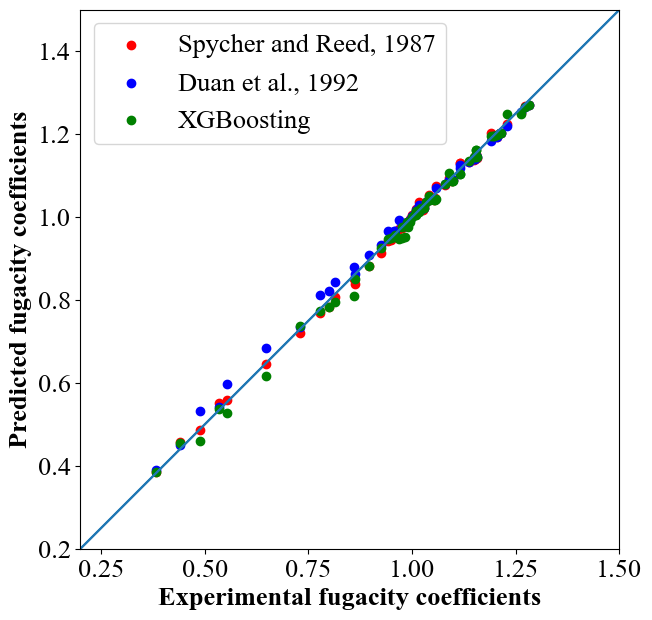

In [55]:
plt.figure(figsize=(7*1.618, 7))
matplotlib.rcParams.update({'font.size': 19})
plt.rcParams["font.family"] = "Times New Roman"
plt.scatter(df_fug_emp['CO2 fugacity coefficient'], df_fug_emp['Spycher and Reed, 1987'],color='r', label='Spycher and Reed, 1987')
plt.scatter(df_fug_emp['CO2 fugacity coefficient'], df_fug_emp['Duan, 1992'],color='b', label='Duan et al., 1992')
plt.scatter(df_fug_emp['CO2 fugacity coefficient'], df_fug_emp['Xgb_prediction'],color='g', label='XGBoosting')

plt.xlabel('Experimental fugacity coefficients',fontweight='bold')
plt.ylabel('Predicted fugacity coefficients',fontweight='bold')
plt.axis('scaled')
plt.plot(range(6))
plt.xlim(0.2, 1.5)
plt.ylim(0.2, 1.5)
plt.axline((0,0), slope=1)
plt.gca().set_aspect('equal', adjustable='box')
plt.legend()
plt.show()

In [65]:
df_fug_emp.columns

Index(['T/C', 'P/bar', 'CO2 fugacity coefficient', 'Experiments',
       'Spycher and Reed, 1987', 'Duan, 1992', 'Xgb_prediction',
       'Deviation_Spycher'],
      dtype='object')

In [68]:
df_fug_emp['Deviation_Spycher']=(abs(df_fug_emp['CO2 fugacity coefficient']-df_fug_emp['Spycher and Reed, 1987'])/df_fug_emp['CO2 fugacity coefficient'])*100
df_fug_emp['Deviation_XGb']=(abs(df_fug_emp['CO2 fugacity coefficient']-df_fug_emp['Xgb_prediction'])/df_fug_emp['CO2 fugacity coefficient'])*100
df_fug_emp['Deviation_Duan']=(abs(df_fug_emp['CO2 fugacity coefficient']-df_fug_emp['Duan, 1992'])/df_fug_emp['CO2 fugacity coefficient'])*100
df_fug_emp.head()

,T/C,P/bar,CO2 fugacity coefficient,Experiments,"Spycher and Reed, 1987","Duan, 1992",Xgb_prediction,Deviation_Spycher,Deviation_XGb,Deviation_Duan
0,820.0,800,1.214339,Angus et al. 1976,1.203404,1.203265,1.202375,0.900427,0.985173,0.911874
1,620.0,800,1.196920,Angus et al. 1976,1.193285,1.196215,1.196046,0.303694,0.073023,0.058936
2,460.0,800,1.153857,Angus et al. 1976,1.150537,1.149968,1.161123,0.287687,0.629757,0.337029
3,420.0,800,1.115397,Angus et al. 1976,1.131089,1.125955,1.103081,1.406828,1.104187,0.946584
4,1000.0,600,1.151054,"Rhyzenko and Volkov, 1971",1.139656,1.139186,1.143711,0.990183,0.637917,1.031039


In [67]:
df_fug_emp.to_excel("Fugacity_prediction_test_data.xlsx")

In [69]:
df_fug_emp.describe()

,T/C,P/bar,CO2 fugacity coefficient,"Spycher and Reed, 1987","Duan, 1992",Xgb_prediction,Deviation_Spycher,Deviation_XGb,Deviation_Duan
count,64.000000,64.000000,64.000000,64.000000,64.000000,64.000000,64.000000,64.000000,64.000000
mean,509.296875,400.000000,0.994871,0.992602,0.998246,0.988575,0.783617,1.129450,1.188550
std,301.459238,304.985037,0.199406,0.197660,0.190028,0.201581,0.745281,1.312929,1.681035
min,80.000000,50.000000,0.382241,0.384502,0.389536,0.386067,0.001176,0.003847,0.004747
25%,320.000000,100.000000,0.954685,0.951183,0.965729,0.949608,0.235481,0.305303,0.330277
50%,455.000000,300.000000,1.019447,1.020254,1.020610,1.020018,0.685839,0.810673,0.776422
75%,805.000000,600.000000,1.120915,1.131213,1.127856,1.112609,1.089261,1.215222,1.124036
max,1000.000000,1000.000000,1.281350,1.270000,1.270513,1.270729,3.602251,6.061910,9.052757


In [60]:
MSE_Spycher= mean_squared_error(df_fug_emp['CO2 fugacity coefficient'], df_fug_emp['Spycher and Reed, 1987'])
print(MSE_Spycher)
MSE_Duan= mean_squared_error(df_fug_emp['CO2 fugacity coefficient'], df_fug_emp['Duan, 1992'])
print(MSE_Duan)
MSE_XGboost= mean_squared_error(df_fug_emp['CO2 fugacity coefficient'], df_fug_emp['Xgb_prediction'])
print(MSE_XGboost)

8.413718372404682e-05
4.9101272302303125e-05
0.00020318311866894607


In [40]:
print("R2-score_Spycher: %.2f" % r2_score(df_fug_emp['CO2 fugacity coefficient'], df_fug_emp['Spycher and Reed, 1987']))
print("R2-score_Duan: %.2f" % r2_score(df_fug_emp['CO2 fugacity coefficient'], df_fug_emp['Duan, 1992']))
print("R2-score_XGb: %.2f" % r2_score(df_fug_emp['CO2 fugacity coefficient'], df_fug_emp['Xgb_prediction']))


R2-score_Spycher: 1.00
R2-score_Duan: 1.00
R2-score_XGb: 1.00


In [47]:
math.exp(ln_phi_xgb(388.75-273.15,41.4))

0.8866465091705322

In [81]:
CO2_mol_sw_old(18,10.342,5.57,5.57,0,0,0,5.57,0)[0]

0.13870235516729676

In [82]:
CO2_mol_sw_new(18,10.342,5.57,5.57,0,0,0,5.57,0)[0]

0.13832622325258076

In [83]:
CO2_mol_sw_old(19,82.73709,0,0,0,0,0,0,0)[0]

1.4985729018255476

In [84]:
CO2_mol_sw_new(19,82.73709,0,0,0,0,0,0,0)[0]

1.5185179533777022

Checking CO2 solubility in 1m brines

In [85]:
#https://www.sciencedirect.com/science/article/pii/S0009254102002632 has the Co2 solubility data for NaCl brine. Can be used to verify the code.
import warnings
warnings.simplefilter("ignore", UserWarning)
P=50 #bar
T_C= [30,60,90,120,150,180,210,240] #C
P_bar=[]
m=1 #NaCl
solubility_experimental=[0.8729,0.5502,0.4103,0.3447,0.3106,0.2837,0.2399,0.1467]
solubility_estimated_old=[]
solubility_estimated_new=[]
for i in T_C:
    P_bar.append(50)
    mol_old=CO2_mol_sw_old(i,50,1,1,0,0,0,1,0)[0]
    mol_new=CO2_mol_sw_new(i,50,1,1,0,0,0,1,0)[0]
    solubility_estimated_old.append(mol_old)
    solubility_estimated_new.append(mol_new)
df_molfraction_50=pd.DataFrame(list(zip(P_bar,T_C,solubility_experimental,solubility_estimated_old,solubility_estimated_new)),columns= ['Pressure, bar','Temp, C','solubility_experimental,mol/kg', 'solubility_estimated_old,mol/kg','solubility_estimated_new,mol/kg'])
df_molfraction_50.head(n=10)

,"Pressure, bar","Temp, C","solubility_experimental,mol/kg","solubility_estimated_old,mol/kg","solubility_estimated_new,mol/kg"
0,50,30,0.8729,0.874861,0.861025
1,50,60,0.5502,0.551503,0.545534
2,50,90,0.4103,0.411302,0.415916
3,50,120,0.3447,0.345531,0.346054
4,50,150,0.3106,0.311582,0.311890
5,50,180,0.2837,0.285182,0.285600
6,50,210,0.2399,0.242225,0.233421
7,50,240,0.1467,0.147919,0.138597


In [87]:
#https://www.sciencedirect.com/science/article/pii/S0009254102002632 has the Co2 solubility data for NaCl brine. Can be used to verify the code.
P=100 #bar
T_C= [30,60,90,120,150,180,210,240,270] #C
P_bar=[]
m=1 #NaCl
solubility_experimental=[1.09,0.84,0.67,0.60,0.5759,0.5751,0.5755,0.5434,0.4236]
solubility_estimated_old=[]
solubility_estimated_new=[]
for i in T_C:
    P_bar.append(100)
    mol_old=CO2_mol_sw_old(i,100,1,1,0,0,0,1,0)[0]
    mol_new=CO2_mol_sw_new(i,100,1,1,0,0,0,1,0)[0]
    solubility_estimated_old.append(mol_old)
    solubility_estimated_new.append(mol_new)
df_molfraction_100=pd.DataFrame(list(zip(P_bar,T_C,solubility_experimental,solubility_estimated_old,solubility_estimated_new)),columns= ['Pressure, bar','Temp, C','solubility_experimental,mol/kg', 'solubility_estimated_old,mol/kg','solubility_estimated_new,mol/kg'])
df_molfraction_100.head(n=10)

,"Pressure, bar","Temp, C","solubility_experimental,mol/kg","solubility_estimated_old,mol/kg","solubility_estimated_new,mol/kg"
0,100,30,1.0900,1.092682,1.114865
1,100,60,0.8400,0.838335,0.841818
2,100,90,0.6700,0.674946,0.658410
3,100,120,0.6000,0.599964,0.593631
4,100,150,0.5759,0.574597,0.569589
5,100,180,0.5751,0.574224,0.573412
6,100,210,0.5755,0.575465,0.566720
7,100,240,0.5434,0.543938,0.515292
8,100,270,0.4236,0.422841,0.418141


In [ ]:
df_exp=pd.read_excel("/content/drive/MyDrive/modelling/CO2 solubility/CO2_solubility_combined_exp_data.xlsx")
df_exp.head()

,Data Source,"T, K","T, C","P, bar","mNaCl, mol/kg","mCO2, Exp, mol/kg",Ref
0,"Bando, 2003",303.0,29.85,100.0,0.170923,1.290403,NaN
1,"Bando, 2003",303.0,29.85,150.0,0.170923,1.336974,NaN
2,"Bando, 2003",303.0,29.85,200.0,0.170923,1.401135,NaN
3,"Bando, 2003",313.0,39.85,100.0,0.170923,1.151146,NaN
4,"Bando, 2003",313.0,39.85,150.0,0.170923,1.226492,NaN


In [ ]:
df_exp_filterd=df_exp[df_exp['T, C'].between(5,165, inclusive=True)]
df_exp_filterd.head()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: Boolean inputs to the `inclusive` argument are deprecated infavour of `both` or `neither`.
  """Entry point for launching an IPython kernel.


,Data Source,"T, K","T, C","P, bar","mNaCl, mol/kg","mCO2, Exp, mol/kg",Ref
0,"Bando, 2003",303.0,29.85,100.0,0.170923,1.290403,NaN
1,"Bando, 2003",303.0,29.85,150.0,0.170923,1.336974,NaN
2,"Bando, 2003",303.0,29.85,200.0,0.170923,1.401135,NaN
3,"Bando, 2003",313.0,39.85,100.0,0.170923,1.151146,NaN
4,"Bando, 2003",313.0,39.85,150.0,0.170923,1.226492,NaN


In [ ]:
df_exp_filtered_subset=df_exp_filterd.iloc[0:51]
df_exp_filtered_subset.head()

,Data Source,"T, K","T, C","P, bar","mNaCl, mol/kg","mCO2, Exp, mol/kg",Ref
0,"Bando, 2003",303.0,29.85,100.0,0.170923,1.290403,NaN
1,"Bando, 2003",303.0,29.85,150.0,0.170923,1.336974,NaN
2,"Bando, 2003",303.0,29.85,200.0,0.170923,1.401135,NaN
3,"Bando, 2003",313.0,39.85,100.0,0.170923,1.151146,NaN
4,"Bando, 2003",313.0,39.85,150.0,0.170923,1.226492,NaN


In [ ]:
df_exp.columns

Index(['Data Source', 'T, K', 'T, C', ' P, bar ', 'mNaCl, mol/kg',
       'mCO2, Exp, mol/kg', 'Ref'],
      dtype='object')

In [ ]:
import warnings
warnings.simplefilter("ignore", UserWarning)
# #df_exp['solubility_est_old, mol/kg']=df_exp.apply(lambda row: CO2_mol_sw_old(row['T, C'], row[' P, bar '],row['mNaCl, mol/kg'],row['mNaCl, mol/kg'],0,0,0,row['mNaCl, mol/kg'],0), axis='columns')
df_exp['solubility_est_new, mol/kg']=df_exp.apply(lambda row: CO2_mol_sw_new(row['T, C'], row[' P, bar '],row['mNaCl, mol/kg'],row['mNaCl, mol/kg'],0,0,0,row['mNaCl, mol/kg'],0), axis='columns')
# #df2['estimated xCO2']=df2.apply(lambda row: CO2_mol_sw_2(row['T/C'], row['P/Mpa']*10,0,0,0,0,0,0,0)[1], axis='columns')

ValueError: ignored

In [ ]:
CO2_mol_sw_new(19,34.4738,3.35,3.35,0,0,0,3.35,0)[0]

0.3717183703669253